# Image Classification Week 1 - Explainability
### Team 8: Carlos Boned, Luis González, Sígrid Vila
## Table of Contents:
1. *Definition of Functions and Classes*
2. Dataset Visualization
3. Visualization of the Results
    - 3.1 *Visualizations*
4. Understanding the Decisions of the Model
    - 4.1 Understanding the topology and the distribution of data points with KNN
    - 4.2 Plots of the visual words distribution based on best results of different methods
5. Statistical comparison of models
    - 5.1 Fscore T-student
    - 5.2 Accuracy T-student

## 1. *Definition of functions and classes*
This first section is the same as the main notebook. It is just here to get the results but is not the main part of this explainability notebook

In [1]:
import cv2
import numpy as np
import pickle
import matplotlib.pyplot as plt
from sklearn.cluster import MiniBatchKMeans
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import KFold
from sklearn.decomposition import PCA
import os, tqdm
from sklearn.svm import SVC
# from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import auc, roc_curve
from sklearn.preprocessing import LabelBinarizer, LabelEncoder, StandardScaler
from sklearn.manifold import TSNE

from skimage.feature import fisher_vector, learn_gmm

from PIL import Image

import pandas as pd
import seaborn as sns

from typing import *

from sklearn.metrics import average_precision_score, precision_recall_curve
from sklearn.metrics import PrecisionRecallDisplay
from itertools import cycle


import wandb
os.environ["WANDB_ENTITY"] = "c3-mcv"
wandb.login(key = 'ab18aafa8c70616ba4ef66844fc9444794cae54a', relogin=True)

wandb: WARNING If you're specifying your api key in code, ensure this code is not shared publicly.
wandb: WARNING Consider setting the WANDB_API_KEY environment variable, or running `wandb login` from the command line.
wandb: Appending key for api.wandb.ai to your netrc file: /home/carlos/.netrc


True

In [2]:
train_images_filenames = pickle.load(open('train_images_filenames.dat','rb'))
test_images_filenames = pickle.load(open('test_images_filenames.dat','rb'))
train_labels = pickle.load(open('train_labels.dat','rb'))
test_labels = pickle.load(open('test_labels.dat','rb'))

In [3]:
train_images_filenames = ["/".join(path.split("/")[3:]) for path in train_images_filenames]
test_images_filenames = ["/".join(path.split("/")[3:]) for path in test_images_filenames]

In [4]:
#utils functions
def read_pickle(filepath:str) -> Any:
    """
    Read and deserialize a pickled object from the specified file.

    Parameters:
        filepath (str): The path to the file containing the pickled object.

    Returns:
        Any: The deserialized object from the pickled file.
    """
    with open(filepath, "rb") as file:
        load_file = pickle.load(file)

    return load_file

def write_pickle(information:Any,filepath:str):
    """
    Serialize and write an object to the specified file using pickle.

    Parameters:
        information (Any): The object to be serialized and written.
        filepath (str): The path to the file to write the pickled object.
    """

    abs_path = os.path.dirname(filepath)
    os.makedirs(abs_path, exist_ok=True)
    with open(filepath, "wb") as f:
        pickle.dump(information, f)

def split_image_into_blocks(image, level):
    
    # Initialize the list to store blocks
    blocks = []
    # Process each level
    for l in range(1, level + 1):
        # Calculate the number of splits along each axis
        splits = 2 ** (l - 1)

        # Split the image into blocks using np.array_split along both axes
        row_blocks = np.array_split(image, splits, axis=0)
        for row_block in row_blocks:
            col_blocks = np.array_split(row_block, splits, axis=1)
            for col_block in col_blocks:
                blocks.append(col_block)

    return blocks 




def visualize_dataset(image_filenames, labels, samples_per_class=5):
    """
    Visualize the dataset
    """
    print(f'Number of samples: {len(image_filenames)}')
    # get unique classses
    classes = np.unique(np.array(labels))
    num_classes = len(classes)
    #set size for plot
    plt.figure(figsize=(15,8))
    
    for y, cls in enumerate(classes):
        _idxs = np.flatnonzero(np.array(labels) == cls)
        idxs = np.random.choice(_idxs, samples_per_class, replace=False)
        for i, idx in enumerate(idxs):
            plt_idx = i * num_classes + y + 1
            plt.subplot(samples_per_class, num_classes, plt_idx)
            plt.imshow(Image.open(image_filenames[idx]))
            plt.axis('off')
            if i == 0:
                plt.title(f'{cls} ({len(_idxs)})')
    plt.show()
    
    
    

def histogram_intersection_kernel(X, Y):
    """
    Histogram intersection kernel.
    
    Args:
    X: array-like of shape (n_samples_X, n_features)
    Y: array-like of shape (n_samples_Y, n_features)
    
    Returns:
    kernel_matrix: array of shape (n_samples_X, n_samples_Y)
    """
    # Expand dimensions of X and Y for broadcasting
    X_expanded = np.expand_dims(X, 1)
    Y_expanded = np.expand_dims(Y, 0)

    # Compute the minimum between each pair of vectors (broadcasting)
    minima = np.minimum(X_expanded, Y_expanded)

    # Sum over the feature dimension to compute the kernel
    kernel_matrix = np.sum(minima, axis=2)

    return kernel_matrix

def histogram_intersection_distance(X, Y):
    """
    Histogram intersection distance for kNN.
    
    Args:
    X: array-like of shape (n_samples_X, n_features)
    Y: array-like of shape (n_samples_Y, n_features)
    
    Returns:
    distance_matrix: array of shape (n_samples_X, n_samples_Y)
    """
    # Calculate the histogram intersection similarity
    similarity = histogram_intersection_kernel(X, Y)
    
    max_similarity = np.minimum(X.sum(axis=1)[:, np.newaxis], Y.sum(axis=1)[np.newaxis, :])
    return 1 - (similarity / max_similarity)

def accuracy(predictions, labels):
    return sum(predictions == labels) / len(labels)

def precision(predictions, labels, class_label):
    tp = np.sum((predictions == class_label) & (labels == class_label))
    fp = np.sum((predictions == class_label) & (labels != class_label))
    return tp / (tp + fp) if (tp + fp) > 0 else 0

def recall(predictions, labels, class_label):
    tp = np.sum((predictions == class_label) & (labels == class_label))
    fn = np.sum((predictions != class_label) & (labels == class_label))
    return tp / (tp + fn) if (tp + fn) > 0 else 0

def average_precision(predictions, labels):
    classes = np.unique(labels)
    return np.mean([precision(predictions, labels, c) for c in classes])

def average_recall(predictions, labels):
    classes = np.unique(labels)
    return np.mean([recall(predictions, labels, c) for c in classes])

def average_f1(predictions, labels):
    return 2 * average_precision(predictions, labels) * average_recall(predictions, labels) / (average_precision(predictions, labels) + average_recall(predictions, labels))

def compute_macro_roc_curve(y_onehot_test, y_score):
    """
    Computes the ROC curve and ROC area for each class.
    
    Args:
    y_onehot_test: array-like of shape (n_samples, n_classes)
    prob_matrix: array-like of shape (n_samples, n_classes)
    """
    n_classes = y_onehot_test.shape[1]
    # store the fpr, tpr
    fpr, tpr = dict(), dict()
    fpr_grid = np.linspace(0.0, 1.0, 1000)

    for i in range(n_classes):
        fpr[i], tpr[i], _ = roc_curve(y_onehot_test[:, i], y_score[:, i])

    # Interpolate all ROC curves at these points
    mean_tpr = np.zeros_like(fpr_grid)

    for i in range(n_classes):
        mean_tpr += np.interp(fpr_grid, fpr[i], tpr[i])  # linear interpolation

    return fpr_grid, mean_tpr / n_classes

def compute_micro_roc_curve(y_onehot_test, y_score):
    """
    Computes the micro ROC curve and ROC area.
    
    Args:
    y_onehot_test: array-like of shape (n_samples, n_classes)
    prob_matrix: array-like of shape (n_samples, n_classes)
    """
    # Compute micro-average ROC curve
    fpr, tpr, _ = roc_curve(y_onehot_test.ravel(), y_score.ravel())

    return fpr, tpr



In [5]:
class BoVW():
    def __init__(self, config, size_per_class=1e9, preload_features=False, folder_path_train='./MIT_split/train', folder_path_test='./MIT_split/test'):
        
        le = LabelEncoder()
        self.config = config
        
        self.train_dataset = {'image_paths': [], 'labels': []}
        self.test_dataset = {'image_paths': [], 'labels': []}
        

        for label in os.listdir(folder_path_train):
            for i,image_name in enumerate(os.listdir(os.path.join(folder_path_train, label))):
                self.train_dataset['image_paths'].append(os.path.join(folder_path_train, label, image_name))
                self.train_dataset['labels'].append(label)

                # good for making a small test
                if i >= size_per_class:
                    break
                    
        #self.train_dataset['labels'] = le.fit_transform(self.train_dataset['labels'])
        
        #randomizer = np.random.randint(len(self.train_dataset['image_paths']), size=len(self.train_dataset['image_paths']))
        
        #self.train_dataset['image_paths'] = list(np.array(self.train_dataset["image_paths"])[randomizer])
        #self.train_dataset['labels'] = list(np.array(self.train_dataset['labels'])[randomizer])
        
        for label in os.listdir(folder_path_test):
            for i,image_name in enumerate(os.listdir(os.path.join(folder_path_test, label))):
                self.test_dataset['image_paths'].append(os.path.join(folder_path_test, label, image_name))
                self.test_dataset['labels'].append(label)
                
                # good for making a small test
                if i >= size_per_class:
                    break
        
        self.train_dataset['labels'] = np.array(self.train_dataset['labels'])
        self.test_dataset['labels'] = np.array(self.test_dataset['labels'])
        self.train_features_cluster, self.train_features_level, self.test_features_level = self._compute_features(preload=preload_features)
        
        # Classification
        if self.config['classifier'] == 'knn':
            if self.config.get("metric", None) is not None:
                self.classifier = KNeighborsClassifier(n_neighbors=self.config['n_neighbors'], algorithm=self.config['algorithm'], metric=self.config["metric"])
            else:
                self.classifier = KNeighborsClassifier(n_neighbors=self.config['n_neighbors'], algorithm=self.config['algorithm'], p=self.config["p"])

        elif self.config['classifier'] == 'svm':
            self.classifier = SVC(kernel = self.config['kernel'], degree=self.config['degree_pol'], gamma = 'auto', C = self.config['C'], probability=True, random_state=123)
        elif self.config['classifier'] == 'logistic':
            self.classifier = LogisticRegression(multi_class = 'auto', penalty='l2', solver='lbfgs', C = self.config['C'], n_jobs=-1, random_state=123)
            

        self.dim_red = None
        if self.config['n_components'] > 0:
            self.dim_red = PCA(n_components = self.config['n_components'])

        # Standarization
        self.scaler = None
        if self.config['scaler']:
            self.scaler = StandardScaler(with_mean=True, with_std=True)


    def _compute_descriptor_level(self, gray_chunk, color_chunk):

        if self.config['descriptor'] == 'dense_sift':
            # Initialize Dense SIFT extractor
            sift = cv2.SIFT_create()
            kp = [cv2.KeyPoint(x, y, self.config['step_size']) for y in range(0, gray_chunk.shape[0], self.config['step_size'])
                                                                for x in range(0, gray_chunk.shape[1], self.config['step_size'])]
            _, des = sift.compute(gray_chunk, kp)

        elif self.config['descriptor'] == 'sift':
            # Initialize Dense SIFT extractor
            sift = cv2.SIFT_create(nfeatures=self.config["n_features"])
            _, des = sift.detectAndCompute(gray_chunk, None)

        elif self.config['descriptor'] == 'akaze':
            # Initialize AKAZE extractor
            akaze = cv2.AKAZE_create(descriptor_type=cv2.AKAZE_DESCRIPTOR_KAZE, threshold=0.0001)
            _, des = akaze.detectAndCompute(color_chunk, None)
          
        return des

    def _compute_features(self, preload=False):
        
        if preload:
            level_features_train = read_pickle(filepath=os.path.join(".", "descriptors", "train", self.config["descriptor"]+'_'+ str(self.config["level_pyramid"]) + ".pkl"))
            level_features_test = read_pickle(filepath=os.path.join(".", "descriptors", "test", self.config["descriptor"]+'_'+ str(self.config["level_pyramid"]) + ".pkl"))
            cluster_features_train = np.concatenate([np.concatenate(image_feat_array, axis=0) for image_feat_array in level_features_train], axis=0)
            return cluster_features_train, level_features_train, level_features_test

        cluster_features_train = []
        level_features_train, level_features_test = [], []
        # Iterate over all files in the directory
        for i,dataset in enumerate([self.train_dataset['image_paths'], self.test_dataset['image_paths']]):
            for filename in tqdm.tqdm(dataset, desc='Extracting features from dataset %d' % i):
                
                # Load the imag
                img = cv2.imread(filename)
                gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
                img_blocks = split_image_into_blocks(img, self.config['level_pyramid'])
                gray_blocks = split_image_into_blocks(gray, self.config['level_pyramid'])

                level_features = [] # levels x np.array([n_features, 128])
                for c_block, g_block in zip(img_blocks, gray_blocks):
                    des = self._compute_descriptor_level(g_block, c_block)

                    if des is not None:
                        level_features.append(des.astype(np.float64)) # may contain different number of features for each level
                    else:
                        hist, _ = np.histogramdd(c_block.reshape(-1, 3), bins = 128 if self.config['descriptor'] != 'akaze' else 64)
                        level_features.append((hist.sum(axis=1).sum(axis=0) / hist.sum()).reshape(1,-1).astype(np.float64))
                
                cluster_features = np.concatenate(level_features, axis=0) # shape (levels * n_features, 128), n_features does not need to be the same for each level

                if i == 0:
                    cluster_features_train.append(cluster_features)
                    level_features_train.append(level_features)
                else:
                    level_features_test.append(level_features)

        # saving features -> from level_features we can get the cluster_features
        os.makedirs(os.path.join(".", "descriptors", "train"), exist_ok=True)
        write_pickle(filepath=os.path.join(".", "descriptors", "train", self.config["descriptor"]+'_'+ str(self.config["level_pyramid"]) + ".pkl"), information=level_features_train)
        
        os.makedirs(os.path.join(".", "descriptors", "test"), exist_ok=True)
        write_pickle(filepath=os.path.join(".", "descriptors", "test", self.config["descriptor"]+'_'+ str(self.config["level_pyramid"]) + ".pkl"), information=level_features_test)
        return np.concatenate(cluster_features_train, axis=0), level_features_train, level_features_test

    def fit(self, train_features_cluster=None, train_features_level=None, y_train_labels=None):

        if train_features_cluster is None and train_features_level is None and y_train_labels is None:
            train_features_cluster = self.train_features_cluster
            train_features_level = self.train_features_level
            y_train_labels = self.train_dataset['labels']
         
        if self.config["fisher"]:
            self.cluster = learn_gmm(self.train_features_cluster, n_modes=self.config["n_words"], gm_args={'n_init': 1, 'max_iter': 50, 'covariance_type':'diag'})
        else:
            self.cluster = MiniBatchKMeans(n_clusters=self.config['n_words'], n_init='auto', compute_labels=True, random_state=123)
            self.cluster.fit(self.train_features_cluster)
        
        visual_words_train = self._extract_visual_words(train_features_level)
        
        if self.config['scaler']:
            visual_words_train = self.scaler.fit_transform(visual_words_train)
        
        if self.dim_red is not None:
            visual_words_train = self.dim_red.fit_transform(visual_words_train)

        
         # Compute distance/kenrel matrix
        if self.config['classifier'] == 'knn' and self.config['metric'] == 'precomputed':
            self.visual_words_train_old = visual_words_train.copy()
            visual_words_train = histogram_intersection_distance(visual_words_train, visual_words_train)

        elif self.config['classifier'] == 'svm' and self.config['kernel'] == 'precomputed':
            self.visual_words_train_old = visual_words_train.copy()
            visual_words_train = histogram_intersection_kernel(visual_words_train, visual_words_train)
            
        self.classifier.fit(visual_words_train, y_train_labels)
        


    def predict(self, test_features_level=None):
        
        if test_features_level is None:
            test_features_level = self.test_features_level

        visual_words_test = self._extract_visual_words(test_features_level)

        if self.config['scaler']:
            visual_words_test = self.scaler.transform(visual_words_test)
        
        if self.dim_red is not None:
            visual_words_test = self.dim_red.transform(visual_words_test)

        # Compute distance/kenrel matrix
        if self.config['classifier'] == 'knn' and self.config['metric'] == 'precomputed':
            visual_words_test = histogram_intersection_distance(visual_words_test, self.visual_words_train_old)
            
        elif self.config['classifier'] == 'svm' and self.config['kernel'] == 'precomputed':
            visual_words_test = histogram_intersection_kernel(visual_words_test, self.visual_words_train_old)
    

        return self.classifier.predict(visual_words_test), self.classifier.predict_proba(visual_words_test)
    
    def _extract_test_visual_words(self):
        
        test_features_level = self.test_features_level
        
        visual_words_test = self._extract_visual_words(test_features_level)
        
        if self.config['scaler']:
            visual_words_test = self.scaler.transform(visual_words_test)

        if self.dim_red is not None:
            visual_words_test = self.dim_red.transform(visual_words_test)
        
        return visual_words_test
    
    def _extract_train_visual_words(self):
        train_features_level = self.train_features_level
        visual_words_train = self._extract_visual_words(train_features_level)
        
        if self.config['scaler']:
            visual_words_train = self.scaler.transform(visual_words_train)

        if self.dim_red is not None:
            visual_words_train = self.dim_red.transform(visual_words_train)
        
        return visual_words_train 

    def _extract_visual_words(self, features_level=None):



        dim_des = 128 if self.config['descriptor'] != 'akaze' else 64
        dim_size = self.config['n_words'] if not self.config["fisher"] else 2*self.config['n_words']*dim_des + self.config['n_words'] # n_words or 2KD+K for fisher
        visual_words = np.zeros((len(features_level), self.config['level_pyramid'], dim_size), dtype=np.float64) # we will need shape (n_images, dim_size)


        for i in range(len(features_level)):
            for l in range(self.config['level_pyramid']):
                words = self.cluster.predict(features_level[i][l]) if not self.config["fisher"] else fisher_vector(features_level[i][l], self.cluster)
                visual_words[i,l,:] = np.bincount(words, minlength=self.config['n_words']) if not self.config["fisher"] else words

        visual_words = visual_words.reshape(len(features_level), -1) # get shape (n_images, dim_size*level_pyramid)
        
        return visual_words
        
        
    
def cross_validation(bovw):
    
    kf = KFold(n_splits=bovw.config['n_folds'], shuffle=True, random_state=123)
    predictions, y_scores, labels = [], [], []

    for train_index, test_index in tqdm.tqdm(kf.split(bovw.train_features_level), desc='Cross validation', total=bovw.config['n_folds']):
        # Split features and labels for this fold
        X_train_level, X_test_level = [bovw.train_features_level[i] for i in train_index] , [bovw.train_features_level[i] for i in test_index]
        y_train_level, y_test = bovw.train_dataset['labels'][train_index], bovw.train_dataset['labels'][test_index]

        X_train_cluster = np.concatenate([np.concatenate(image_feat_array, axis=0) for image_feat_array in X_train_level], axis=0)

        # Fit the classifier
        
        bovw.fit(X_train_cluster, X_train_level, y_train_level)
        # Predict the test set
        pred, y_score = bovw.predict(X_test_level)
        
        y_scores.append(y_score)
        predictions.append(pred)
        labels.append(y_test)

    return predictions, y_scores, labels
    
def log_metrics(config, predictions, y_scores, y_test, plot='micro'):
    wandb.log({
        'accuracy': np.mean([accuracy(predictions[i], y_test[i]) for i in range(len(predictions))]),
        'average_precision': np.mean([average_precision(predictions[i], y_test[i]) for i in range(len(predictions))]),
        'average_recall': np.mean([average_recall(predictions[i], y_test[i]) for i in range(len(predictions))]),
        'average_f1': np.mean([average_f1(predictions[i], y_test[i]) for i in range(len(predictions))]),
    })

    # ----------------- #
    #Log ROC curve
    
    n_folds = config['n_folds']
    result_auc = []
    for n in range(n_folds):
        y_onehot_test = LabelBinarizer().fit_transform(y_test[n])
        if plot == 'micro':
            fpr, tpr = compute_micro_roc_curve(y_onehot_test, y_scores[n])
        else:
            fpr, tpr = compute_macro_roc_curve(y_onehot_test, y_scores[n])

        #compute AUC
        result_auc.append(auc(fpr, tpr))
    wandb.log({'AUC': np.mean(result_auc)})



def sweep_bovw():
    with wandb.init() as run:
        # Get hyperparameters
        config = run.config
        if config['fisher']:
            config['n_words'] = config['n_words'] // 2
        print(config)
        bovw = BoVW(config)
        predictions, y_scores, labels = cross_validation(bovw)
        log_metrics(config, predictions, y_scores, labels)


In [6]:
# 'n_neigh': {'distribution':'int_uniform', 'min': 1, 'max': 10}
# 'metric': {'values': ['euclidean', 'manhattan', 'cosine', 'precomputed]} # implement histogram intersection function distance
# 'step_size': {'distribution':'int_uniform', 'min': 4, 'max': 50},

# Define the sweep for each classifier and each descriptor
sweep_configuration = {
    "method": "bayes",
    "name": "sweep-KNN-sift_K_diff_1_extended",
    "metric": {"goal": "maximize", "name": "accuracy"},
    "parameters": {
        'classifier': {'value': 'knn'},
        'descriptor': {'value': 'sift'},
        'step_size': {'distribution':'int_uniform', 'min': 16, 'max': 64 },
        'n_features': {'value': 1024},
        'n_folds': {'value': 5},
        'n_words': {'distribution':'int_uniform', 'min': 512, 'max': 1024},
        'level_pyramid': {'values': [1, 2]},
        'n_neighbors': {'distribution':'int_uniform', 'min': 1, 'max': 10},
        'n_components': {'distribution':'int_uniform', 'min': 16, 'max': 128},
        'algorithm': {'values': ['brute']},
        'p': {'values': [1, 2]},
        'fisher': {'values': [False]},
        'scaler': {'values': [True, False]}
    },
}

#sweep_id = wandb.sweep(sweep=sweep_configuration, project="bovw", entity="c3-mcv") # EJECUTAR UNA VEZ POR CLASIFICADOR Y DESCRIPTOR

In [7]:
#wandb.agent('c3-mcv/bovw/43nzrujf', function=sweep_bovw, count=10)

## 2. Dataset visualization

We visualize some of the images of the dataset.

Number of samples: 1881


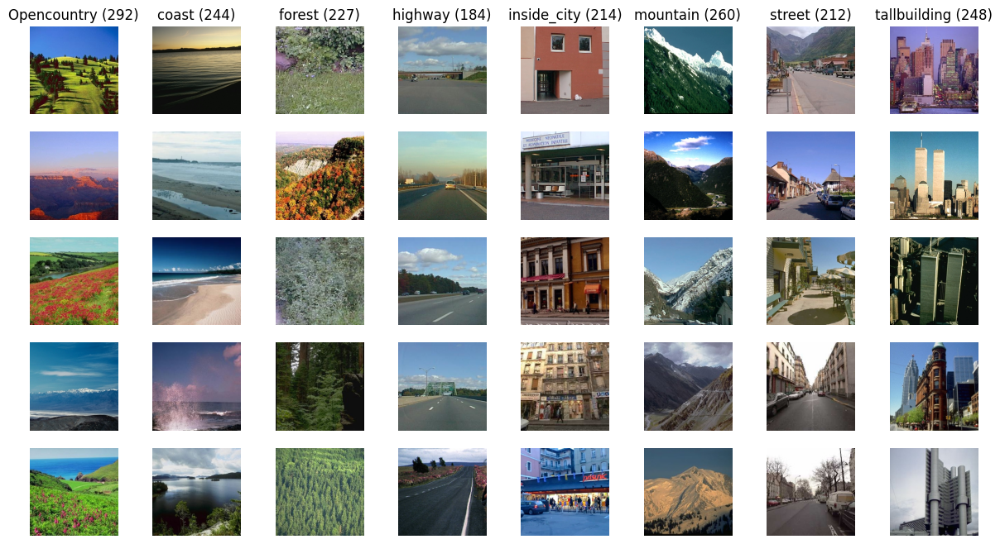

In [8]:
visualize_dataset(train_images_filenames, train_labels, samples_per_class=5)

## 3. Visualization of the results

First, we perform inference. The goal is to visualize the results given by the 3 classifiers we used and compare them. So, we perform an inference using each of the classifiers and the previously found optimal hyperparameters for each (those can be found in the PowerPoint).

*config = {
    'descriptor': 'dense_sift',
    'step_size': 12,
    'n_words': 501,
    "n_features": 164,
    'n_neigh': None,
    'metric': histogram_intersection_distance,
    'n_folds': None,
    'n_components': 150,
    'level_pyramid': 2,
    'C':0.01,
    'degree_pol': 2,
    'kernel': 'precomputed',
    'classifier': 'svm',
    'fisher': False,
    'scaler': False,
}
bovw = BoVW(config, preload_features=True)
bovw.fit()
predictions, y_score = bovw.predict()*


*config = {
    'descriptor': 'dense_sift',
    'step_size': 10,
    'n_words': 223,
    "n_features": 164,
    'n_neigh': None,
    'metric': histogram_intersection_distance,
    'n_folds': None,
    'n_components': 59,
    'level_pyramid': 2,
    'C':0.01,
    'degree_pol': 2,
    'kernel': 'precomputed',
    'classifier': 'logistic',
    'fisher': False,
    'scaler': True,
}*


*config = {
    'descriptor': 'dense_sift',
    'step_size': 10,
    'n_words': 890,
    "n_features": 164,
    'n_neighbors': 9,
    'metric': "euclidean",
    'n_folds': 5,
    'n_components': 51,
    'level_pyramid': 1,
    'C':0.01,
    'degree_pol': 2,
    'kernel': 'precomputed',
    'classifier': 'knn',
    'fisher': False,
    'scaler': True,
    "algorithm":"brute"
}*

In [15]:
config = {
    'descriptor': 'dense_sift',
    'step_size': 10,
    'n_words': 890,
    "n_features": 164,
    'n_neighbors': 9,
    'metric': "euclidean",
    'n_folds': 5,
    'n_components': 51,
    'level_pyramid': 1,
    'C':0.01,
    'degree_pol': 2,
    'kernel': 'precomputed',
    'classifier': 'knn',
    'fisher': False,
    'scaler': True,
    "algorithm":"brute"
}
bovw = BoVW(config, preload_features=True)
bovw.fit()
predictions, y_score = bovw.predict()

### 3.1 *Visualizations*
In this section we have some of the visualizations explained in the main notebook (BagofVisualWords.ipynb). Thus, this part can be skiped.

#### Confusion matrix

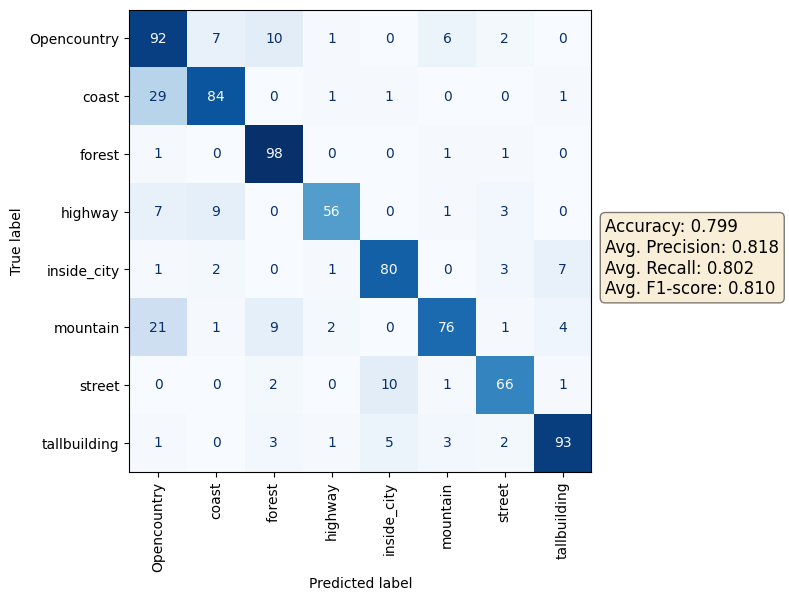

In [16]:
# plot confusion matrix
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

cm = confusion_matrix(bovw.test_dataset['labels'], predictions)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=np.unique(bovw.test_dataset['labels']))
_, ax = plt.subplots(figsize=(6, 6))
disp.plot(ax=ax, cmap=plt.cm.Blues, xticks_rotation='vertical', colorbar=False)

# Adding text for metrics
textstr = '\n'.join((
    f'Accuracy: {accuracy(predictions, bovw.test_dataset["labels"]):.3f}',
    f'Avg. Precision: {average_precision(predictions, bovw.test_dataset["labels"]):.3f}',
    f'Avg. Recall: {average_recall(predictions, bovw.test_dataset["labels"]):.3f}',
    f'Avg. F1-score: {average_f1(predictions, bovw.test_dataset["labels"]):.3f}'))

# These are matplotlib.patch.Patch properties
props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)

# Place a text box in upper left in axes coords
ax.text(1.03, 0.55, textstr, transform=ax.transAxes, fontsize=12,
        verticalalignment='top', bbox=props)

plt.show()

#### Micro averaged precision-recall curve

['Opencountry' 'coast' 'forest' 'highway' 'inside_city' 'mountain'
 'street' 'tallbuilding']


Text(0.5, 1.0, 'Micro-averaged Precision-Recall curve')

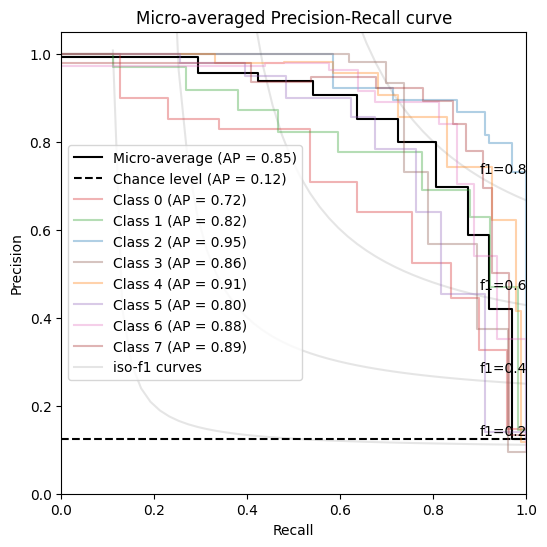

In [17]:
# https://scikit-learn.org/stable/auto_examples/model_selection/plot_precision_recall.html#sphx-glr-auto-examples-model-selection-plot-precision-recall-py
from sklearn.preprocessing import OneHotEncoder

colors = ["tab:red", "tab:green", "tab:blue", "tab:brown", "tab:orange", "tab:purple", "tab:pink", "brown"]
enc = LabelBinarizer()


y_onehot_test = OneHotEncoder(handle_unknown='ignore').fit_transform(np.array(bovw.test_dataset['labels']).reshape(-1, 1)).toarray()
clas = (np.unique(bovw.test_dataset['labels']))
n_classes = y_onehot_test.shape[1]
print(clas)

# For each class
precision_dict  = dict()
recall_dict  = dict()
average_precision_dict = dict()
for i in range(n_classes):
    precision_dict[i], recall_dict[i], _ = precision_recall_curve(y_onehot_test[:, i], y_score[:, i])
    average_precision_dict[i] = average_precision_score(y_onehot_test[:, i], y_score[:, i])

# A "micro-average": quantifying score on all classes jointly
precision_dict["micro"], recall_dict["micro"], _ = precision_recall_curve(
    y_onehot_test.ravel(), y_score.ravel()
)
average_precision_dict["micro"] = average_precision_score(y_onehot_test, y_score, average="micro")


from collections import Counter

_, ax = plt.subplots(figsize=(6, 6))

f_scores = np.linspace(0.2, 0.8, num=4)
lines, labels = [], []
for f_score in f_scores:
    x = np.linspace(0.01, 1)
    y = f_score * x / (2 * x - f_score)
    (l,) = plt.plot(x[y >= 0], y[y >= 0], color="gray", alpha=0.2)
    plt.annotate("f1={0:0.1f}".format(f_score), xy=(0.9, y[45] + 0.02))

display = PrecisionRecallDisplay(
    recall=recall_dict["micro"],
    precision=precision_dict["micro"],
    average_precision=average_precision_dict["micro"],
    prevalence_pos_label=Counter(y_onehot_test.ravel())[1] / y_onehot_test.size,
)
display.plot(ax=ax, name="Micro-average", plot_chance_level=True, color='black')


for i, (cl, color) in enumerate(zip(clas, colors)):
    display = PrecisionRecallDisplay(
        recall=recall_dict[i],
        precision=precision_dict[i],
        average_precision=average_precision_dict[i],
    )
    display.plot(ax=ax, name=f"Class {i}", color=color, alpha=0.35)

# add the legend for the iso-f1 curves
handles, labels = display.ax_.get_legend_handles_labels()
handles.extend([l])
labels.extend(["iso-f1 curves"])
# set the legend and the axes
ax.set_xlim([0.0, 1.0])
ax.set_ylim([0.0, 1.05])
ax.legend(handles=handles, labels=labels, loc="best")
ax.set_title("Micro-averaged Precision-Recall curve")

#### Micro averaged precision-recall curve varying only 1 parameter

In [21]:
all_predictions, all_y_scores = [], []
kernel_values = ['precomputed', 'rbf', 'linear', 'poly', 'sigmoid']
#metrics = ['cityblock', 'cosine', 'euclidean', 'manhattan']
#n_neighbors = [1, 3, 5, 7, 9, 12, 15, 27]

c_values = [0.001, 0.01, 0.1, 1, 10, 100]
for x in kernel_values:
    config['kernel'] = x
    bovw = BoVW(config, preload_features=True)
    bovw.fit()
    predictions, y_score = bovw.predict()
    all_predictions.append(predictions)
    all_y_scores.append(y_score)

Text(0.5, 1.0, 'Micro-averaged Precision-Recall curve comparing different neighboors')

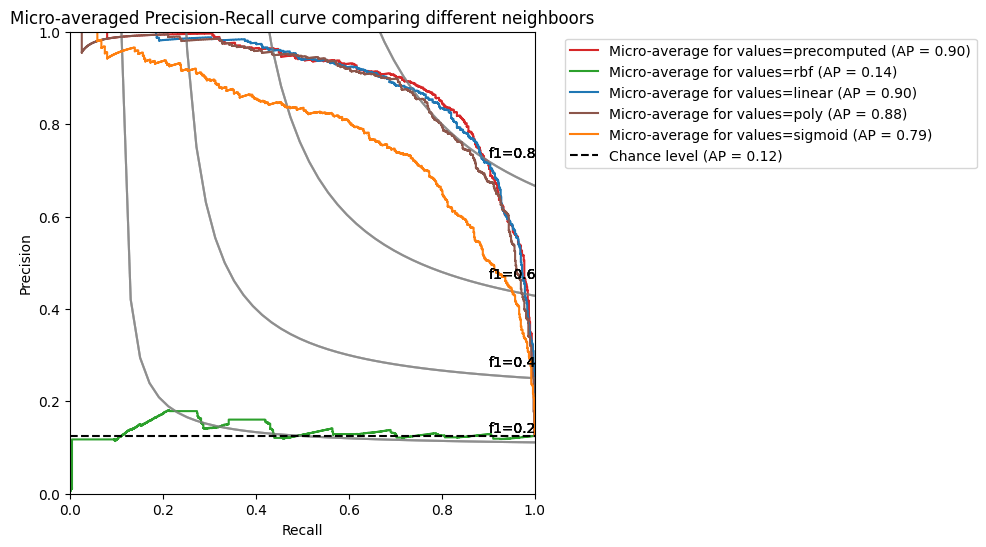

In [22]:
colors = ["tab:red", "tab:green", "tab:blue", "tab:brown", "tab:orange", "tab:purple", "tab:pink", "brown"]

y_onehot_test = LabelBinarizer().fit_transform(bovw.test_dataset['labels'])
n_classes = y_onehot_test.shape[1]

_, ax = plt.subplots(figsize=(6, 6))

for j, (predictions, y_score) in enumerate(zip(all_predictions, all_y_scores)):
    # For each class
    precision_dict  = dict()
    recall_dict  = dict()
    average_precision_dict = dict()
    for i in range(n_classes):
        precision_dict[i], recall_dict[i], _ = precision_recall_curve(y_onehot_test[:, i], y_score[:, i])
        average_precision_dict[i] = average_precision_score(y_onehot_test[:, i], y_score[:, i])

    # A "micro-average": quantifying score on all classes jointly
    precision_dict["micro"], recall_dict["micro"], _ = precision_recall_curve(
        y_onehot_test.ravel(), y_score.ravel()
    )
    average_precision_dict["micro"] = average_precision_score(y_onehot_test, y_score, average="micro")

    f_scores = np.linspace(0.2, 0.8, num=4)
    lines, labels = [], []
    for f_score in f_scores:
        x = np.linspace(0.01, 1)
        y = f_score * x / (2 * x - f_score)
        (l,) = plt.plot(x[y >= 0], y[y >= 0], color="gray", alpha=0.35)
        plt.annotate("f1={0:0.1f}".format(f_score), xy=(0.9, y[45] + 0.02))

    display = PrecisionRecallDisplay(
        recall=recall_dict["micro"],
        precision=precision_dict["micro"],
        average_precision=average_precision_dict["micro"],
        prevalence_pos_label=Counter(y_onehot_test.ravel())[1] / y_onehot_test.size,
    )
    ## remember here change the name of the variable in !!!! 
    display.plot(ax=ax, name=f"Micro-average for values={kernel_values[j]}", plot_chance_level=True if j == len(all_predictions)-1 else False, color=colors[j])


# add the legend for the iso-f1 curves
handles, labels = display.ax_.get_legend_handles_labels()
handles.extend([l])
labels.extend(["iso-f1 curves"])
# set the legend and the axes
ax.set_xlim([0, 1.0])
ax.set_ylim([0, 1.0])
# ax.legend(handles=handles, labels=labels, loc="best")
# disable legend if you want to make a zoom
ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
ax.set_title("Micro-averaged Precision-Recall curve comparing different neighboors")

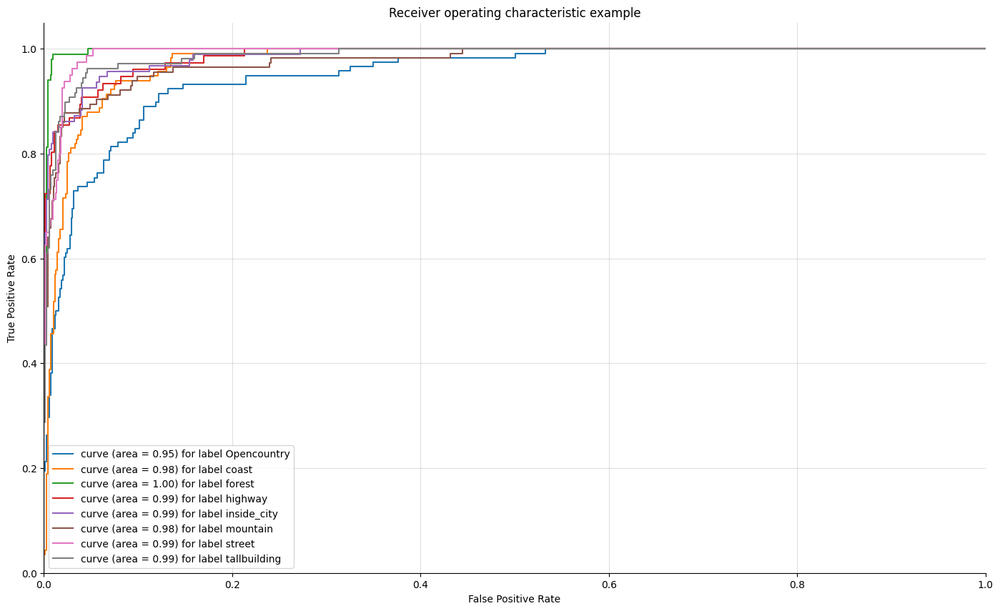

In [36]:
from sklearn.preprocessing import OneHotEncoder
import plotly.express as px
import plotly.graph_objects as go
import seaborn as sns


n_classes = np.unique(bovw.test_dataset['labels'])
enc = OneHotEncoder(handle_unknown='ignore').fit_transform(np.array(bovw.test_dataset['labels']).reshape(-1, 1)).toarray()

def plot_multiclass_curve(y_test_onehot, y_score, n_classes, curve:str="pr", figsize=(17, 10)):

    # structures
    fpr = dict()
    tpr = dict()
    roc_auc = dict()

    # calculate dummies once
    y_test_dummies = y_test_onehot
    
    if curve == "roc":
        fcurve = roc_curve
        
    else:
        fcurve = precision_recall_curve
    for i, cl in enumerate(n_classes):
        fpr[i], tpr[i], _ = fcurve(y_test_dummies[:, i], y_score[:, i])
        
        if curve == "roc":
            roc_auc[i] = auc(fpr[i], tpr[i])
        else:
            roc_auc[i] = auc(tpr[i], fpr[i])

    # roc for each class
    fig, ax = plt.subplots(figsize=figsize)
    ax.set_xlim([0.0, 1.0])
    ax.set_ylim([0.0, 1.05])
    ax.set_xlabel('False Positive Rate')
    ax.set_ylabel('True Positive Rate')
    ax.set_title('Receiver operating characteristic example')
    for i, cl in enumerate(n_classes):
        ax.plot(fpr[i], tpr[i], label='curve (area = %0.2f) for label %s' % (roc_auc[i], cl))
    ax.legend(loc="best")
    ax.grid(alpha=.4)
    sns.despine()
    plt.show()

plot_multiclass_curve(enc, y_score, n_classes=n_classes, curve="roc")


# 4. Understanding the decissions of the model
We decided to add this section to try to make sense of the results given by the model. To do so, we study the misclassifications of the model when using each of the 3 classificators.

The example in the following chunks shows some of the well-classified and then misclassified images by the KNN. Here we can see that some of the misclassifications are even hard for us to tell appart.

In [46]:
def visualize_correct_predictions(image_filenames, labels, predictions, samples_per_class=5):
    print(f'Number of samples: {len(predictions)}')
    print(f'Number of correctly classified samples: {sum(predictions==labels)}')
    
    # get unique classses
    classes = np.unique(np.array(labels))
    num_classes = len(classes)
    #set size for plot
    plt.figure(figsize=(24,16))
    
    def get_index_tp(idxs):
        items = []
        for idx in idxs:
            if predictions[idx] == labels[idx]:
                items.append(idx)
        return items
    
    for y, cls in enumerate(classes):
        idxs_all = np.flatnonzero(np.array(labels) == cls)
        idxs_tp = get_index_tp(idxs_all)
        idxs = np.random.choice(idxs_tp, samples_per_class, replace=False)
        class_accuracy = 100*(len(idxs_tp)/len(idxs_all))
        for i, idx in enumerate(idxs):
            plt_idx = i * num_classes + y + 1
            plt.subplot(samples_per_class, num_classes, plt_idx)
            plt.imshow(Image.open(image_filenames[idx]))
            plt.axis('off')
            if i == 0:
                plt.title(f'ClassAccuracy: {class_accuracy:.2f}  \n GT: {labels[idx]},\n Pred: {predictions[idx]}')
            else:
                plt.title(f'GT: {labels[idx]},\n Pred: {predictions[idx]}')
    plt.show()
    
    
def visualize_wrong_predictions(image_filenames, labels, predictions, samples_per_class=5):
    print(f'Number of samples: {len(predictions)}')
    print(f'Number of wrongly classified samples: {sum(predictions!=labels)}')
    
    
    
    # get unique classses
    classes = np.unique(np.array(labels))
    num_classes = len(classes)

    #set size for plot
    plt.figure(figsize=(24,16))
    
    def get_index_fp(idxs):
        items = []
        for idx in idxs:
            if predictions[idx] != labels[idx]:
                items.append(idx)
        return items
    
    for y, cls in enumerate(classes):
        idxs_all = np.flatnonzero(np.array(labels) == cls)
        idxs_fp = get_index_fp(idxs_all)
        idxs = np.random.choice(idxs_fp, samples_per_class, replace=False)
        class_accuracy = 100*(1 - (len(idxs_fp)/len(idxs_all)))
        for i, idx in enumerate(idxs):
            plt_idx = i * num_classes + y + 1
            plt.subplot(samples_per_class, num_classes, plt_idx)
            plt.imshow(Image.open(image_filenames[idx]))
            plt.axis('off')

            if i == 0:
                plt.title(f'{cls} \n ClassAccuracy: {class_accuracy:.2f}  \n GT: {labels[idx]},\n Pred: {predictions[idx]}')
            else:
                plt.title(f'GT: {labels[idx]},\n Pred: {predictions[idx]}')
    plt.show()
    

    


Number of samples: 807
Number of correctly classified samples: 665


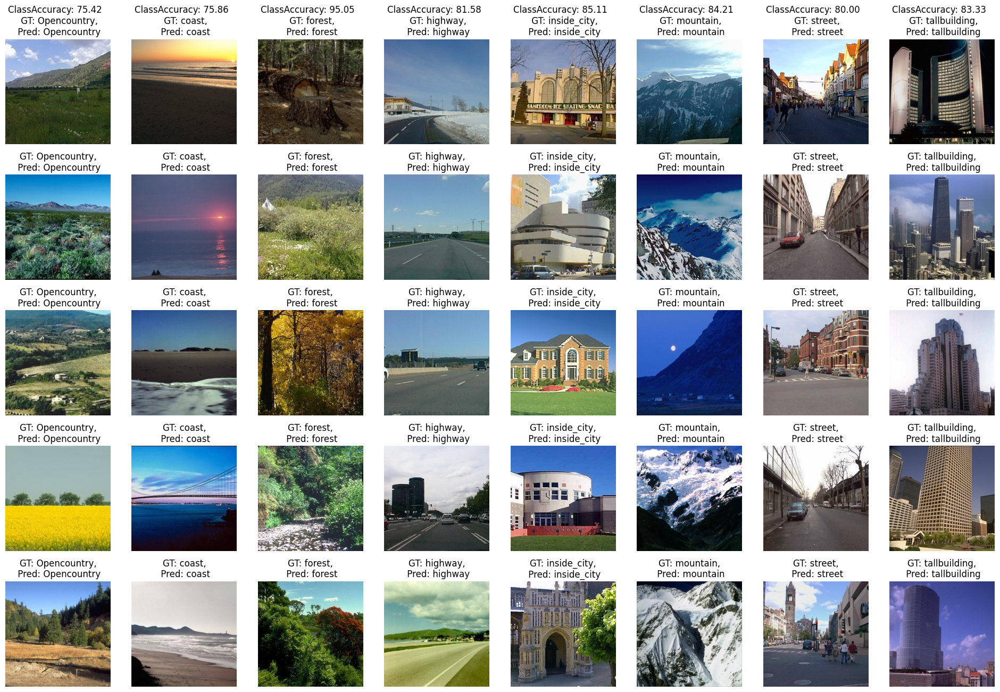

In [47]:
visualize_correct_predictions(bovw.test_dataset['image_paths'], bovw.test_dataset['labels'], predictions, samples_per_class=5)


Number of samples: 807
Number of wrongly classified samples: 142


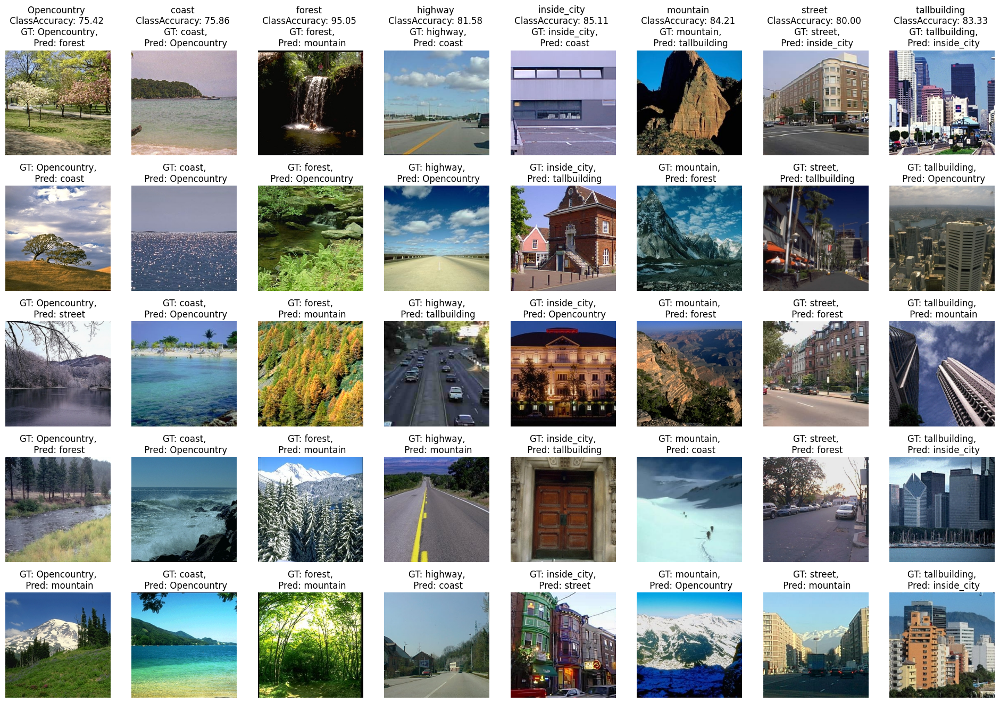

In [51]:
visualize_wrong_predictions(bovw.test_dataset['image_paths'], bovw.test_dataset['labels'], predictions, samples_per_class=5)

### 4.1 Understanding the topology and the distribution of data points with KNN
The following code is to obtain a graphic that shows the relation between the number of k-nearest neighbours and the retrieval precision. For each misprediction, it illustrates how many true class images are in the closest 10 predictions (P@10). The y-axis shows the mean P@10.

In [52]:
from sklearn.manifold import TSNE
from sklearn.neighbors import NearestNeighbors
import seaborn as sns 
import pandas as pd


def get_mismmatch_predictions(image_filenames, labels, predictions):
    print(f'Number of samples: {len(predictions)}')
    print(f'Number of wrongly classified samples: {sum(predictions!=labels)}')
    
    
    
    # get unique classses
    classes = np.unique(np.array(labels))
    num_classes = len(classes)
    missmatch_indexes = {i:[] for i in classes}
    
    def get_index_fp(idxs):
        items = []
        for idx in idxs:
            if predictions[idx] != labels[idx]:
                items.append(idx)
        return items
    
    for y, cls in enumerate(classes):
        idxs_all = np.flatnonzero(np.array(labels) == cls)
        idxs_fp = get_index_fp(idxs_all)
        idxs = idxs_fp#np.random.choice(idxs_fp, samples_per_class, replace=False)
        res = [(idx, predictions[idx]) for idx in idxs]
        missmatch_indexes[cls] = res
        
    return missmatch_indexes

def get_tru_predictions(image_filenames, labels, predictions):
    print(f'Number of samples: {len(predictions)}')
    print(f'Number of wrongly classified samples: {sum(predictions==labels)}')
    
    
    
    # get unique classses
    classes = np.unique(np.array(labels))
    num_classes = len(classes)
    true_indexes = {i:[] for i in classes}
    
    def get_index_tp(idxs):
        items = []
        for idx in idxs:
            if predictions[idx] == labels[idx]:
                items.append(idx)
        return items
    
    for y, cls in enumerate(classes):
        idxs_all = np.flatnonzero(np.array(labels) == cls)
        idxs_fp = get_index_tp(idxs_all)
        idxs = idxs_fp#np.random.choice(idxs_fp, samples_per_class, replace=False)
        res = [(idx, predictions[idx]) for idx in idxs]
        true_indexes[cls] = res
        
    return true_indexes


def CIR_extractiction(train_embeddings:np.ndarray, test_embeddings:np.ndarray, missmatch_indexes:dict, K:int=10):
    result_dict = {cl:{} for cl in missmatch_indexes.keys()}

    for correct_class, indexes_list in missmatch_indexes.items():
        for true_index, predicted_class in indexes_list:
            # Obtener el embedding del punto predicho incorrectamente
            test_point = test_embeddings[true_index].reshape(1, -1)

            # Calcular las distancias a todos los puntos de entrenamiento
            neigh = NearestNeighbors(n_neighbors=K+1)  # 10 vecinos más cercanos + el punto en sí
            neigh.fit(train_embeddings)
            distances, indices = neigh.kneighbors(test_point)

            # Obtener los índices de los 10 puntos más cercanos excluyendo el punto en sí
            nearest_indices = indices[0][1:]

            # Obtener las tuplas (clase del punto del train, punto del train) y agregar al diccionario de salida
            result_dict[correct_class][true_index] = (predicted_class, [(idx, train_embeddings[idx]) for idx in nearest_indices])

    return result_dict  


## Content image retrieval
def plot_CIR(result_dict, train_labels, train_image_paths, test_image_paths, clas:str="Opencountry", sample=5):
    result_dict = result_dict[clas]

    num_cols = 11  # Número de columnas en el plot (1 para la query + 10 para los vecinos más cercanos)
    num_rows = len(result_dict)  # Número de filas en el plot

    fig, axes = plt.subplots(sample, num_cols, figsize=(15, 2 * sample))
    

    for i, (query_index, neighbors_indices) in enumerate(result_dict.items()):
        pred_clas, neighbors_indices = neighbors_indices
        if i+1 > sample:
            break
        # Cargar y mostrar la imagen de la consulta
        query_image_path = test_image_paths[query_index]
        query_image = Image.open(query_image_path)
        axes[i, 0].imshow(query_image)
        axes[i, 0].axis('off')
        axes[i, 0].set_title(f'Q {i+1}:\n True: {clas}\n Pred: {pred_clas}')

        # Cargar y mostrar las imágenes de los vecinos más cercanos
        for j, neighbor_index in enumerate(neighbors_indices):
            neighbor_image_path = train_image_paths[neighbor_index[0]]
            neighbor_image = Image.open(neighbor_image_path)
            axes[i, j + 1].imshow(neighbor_image)
            axes[i, j + 1].axis('off')
            axes[i, j + 1].set_title(f'{train_labels[neighbor_index[0]]}')

    plt.tight_layout()
    plt.show()

def plot_tsne(embeddings, hue_classes, perplexity=10, learning_rate=0.001, random_state=42):
    """
    Visualiza embeddings en un gráfico 2D utilizando t-SNE.

    Parameters:
    - embeddings (array-like): Matriz de embeddings para visualizar.
    - hue_classes (array-like): Clases correspondientes a cada embedding para colorear los puntos.
    - perplexity (int, optional): Parámetro de perplexity para t-SNE (por defecto: 30).
    - learning_rate (int, optional): Tasa de aprendizaje para t-SNE (por defecto: 200).
    - random_state (int, optional): Semilla para reproducibilidad (por defecto: None).

    Returns:
    - None: Muestra el gráfico de dispersión con t-SNE.
    """

    # Aplicar t-SNE a los embeddings
    tsne = TSNE(n_components=2, perplexity=30, random_state=random_state)
    embeddings_2d = tsne.fit_transform(embeddings)
    

    # Crear un gráfico de dispersión con colores según las clases del hue
    unique_classes = np.unique(hue_classes)
    scatter_handles = []

    for class_label in unique_classes:

        class_indices = np.where(np.array(hue_classes) == class_label)
        scatter_handle = plt.scatter(embeddings_2d[class_indices, 0], embeddings_2d[class_indices, 1], label=f'Class {class_label}')
        scatter_handles.append(scatter_handle)

    # Añadir leyenda y mostrar el gráfico
    plt.legend(handles=scatter_handles)
    plt.title('t-SNE Visualization of Embeddings')
    plt.show()

In [35]:
def average_appearence_at_k(actual, predicted, k):
    # Calculate precision at each position
    precision_at_k = [1 if p in actual[:k] else 0 for p in predicted[:k]]

    # Calculate average precision at K
    ap_at_k = sum(precision_at_k)
    
    return ap_at_k

def mean_average_appearence_at_k(result_dict, train_labels, k):
    # Initialize variables
    ap_at_k_list = {classes: [] for classes in result_dict.keys()}
    mean_ap_at_k = {classes: [] for classes in result_dict.keys()}
    # Iterate over each query
    for true_class, mismatches in result_dict.items():
        for query_index, (pred_class, neighbors) in mismatches.items():
            actual_class = true_class # ground_truth_labels[query_index]  # Replace with actual ground truth labels

            # Calculate Average Precision at K for the current query
            ap_at_k = average_appearence_at_k([actual_class], [pred_class] + [train_labels[i] for i, _ in neighbors], k)
            ap_at_k_list[true_class].append(ap_at_k)
    
    # Calculate Mean Average Precision at K
    for true_class, l in ap_at_k_list.items():
        mean_ap_at_k[true_class] = sum(l) / len(l)

    return mean_ap_at_k


In [36]:
missmatch_indexes = get_mismmatch_predictions(bovw.test_dataset['image_paths'], bovw.test_dataset['labels'], predictions)

Number of samples: 807
Number of wrongly classified samples: 143


In [37]:
true_indexes = get_tru_predictions(bovw.test_dataset['image_paths'], bovw.test_dataset['labels'], predictions)

Number of samples: 807
Number of wrongly classified samples: 664


In [38]:
labels_train = bovw.train_dataset['labels']
labels_test = bovw.test_dataset['labels']

vwords_test = bovw._extract_test_visual_words()
vwords_train = bovw._extract_train_visual_words()

whole_points = np.concatenate((vwords_train, vwords_test), axis= 0)
whole_labels = list(labels_train) + list(labels_test)

In [34]:
CIR = CIR_extractiction(train_embeddings=vwords_train, test_embeddings=vwords_test, missmatch_indexes=missmatch_indexes, K=10)

In [ ]:
mean_average_appearence_at_k(CIR, labels_train, 10)

In [78]:
df_Kneighbours = pd.DataFrame()
rows = []
for i in range(1, 25):
    CIR =  CIR_extractiction(train_embeddings=vwords_train, test_embeddings=vwords_test, missmatch_indexes=missmatch_indexes, K=i)
    appearence = mean_average_appearence_at_k(CIR, labels_train, 10)
    appearence["neigh"] = i
    rows.append(appearence)

df_kneigh = pd.DataFrame.from_dict(rows, orient='columns')


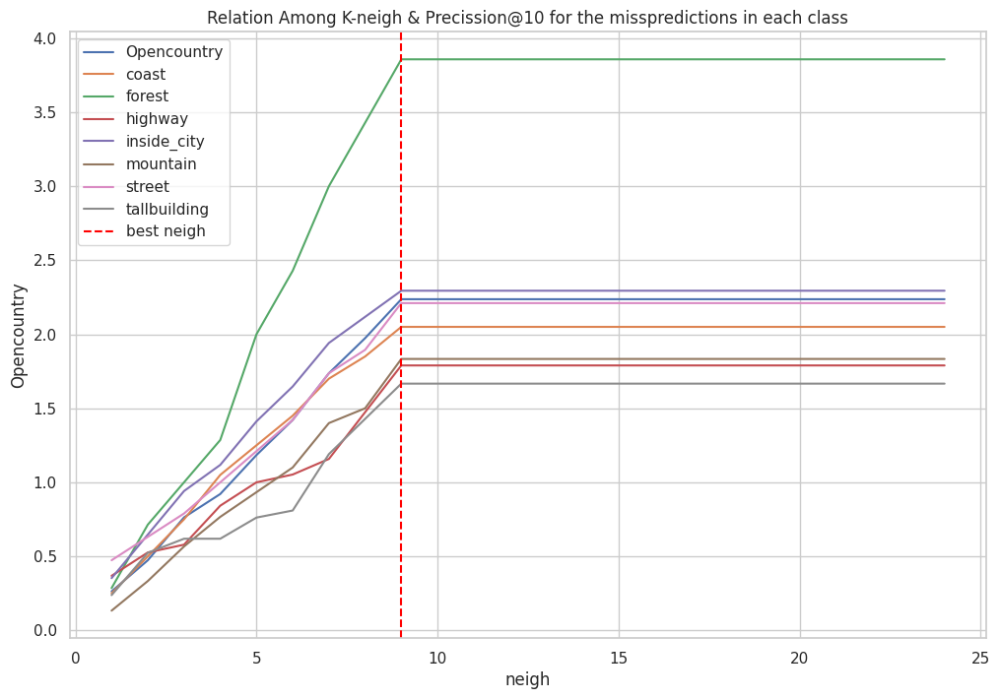

In [94]:
target_column = 'neigh'

# Obtén la lista de columnas (excluyendo la columna de nneighboors)
feature_columns = [col for col in df_kneigh.columns if col != target_column]

# Configura el estilo de seaborn
sns.set(style="whitegrid")

plt.figure(figsize=(12, 8))

for feature_column in feature_columns:
    sns.lineplot(x=target_column, y=feature_column, data=df_kneigh, label=feature_column)

plt.axvline(x=9, color='red', linestyle='--', label='best neigh')
plt.title(f'Relation Among K-neigh & Precission@10 for the misspredictions in each class')
plt.legend()
plt.show()

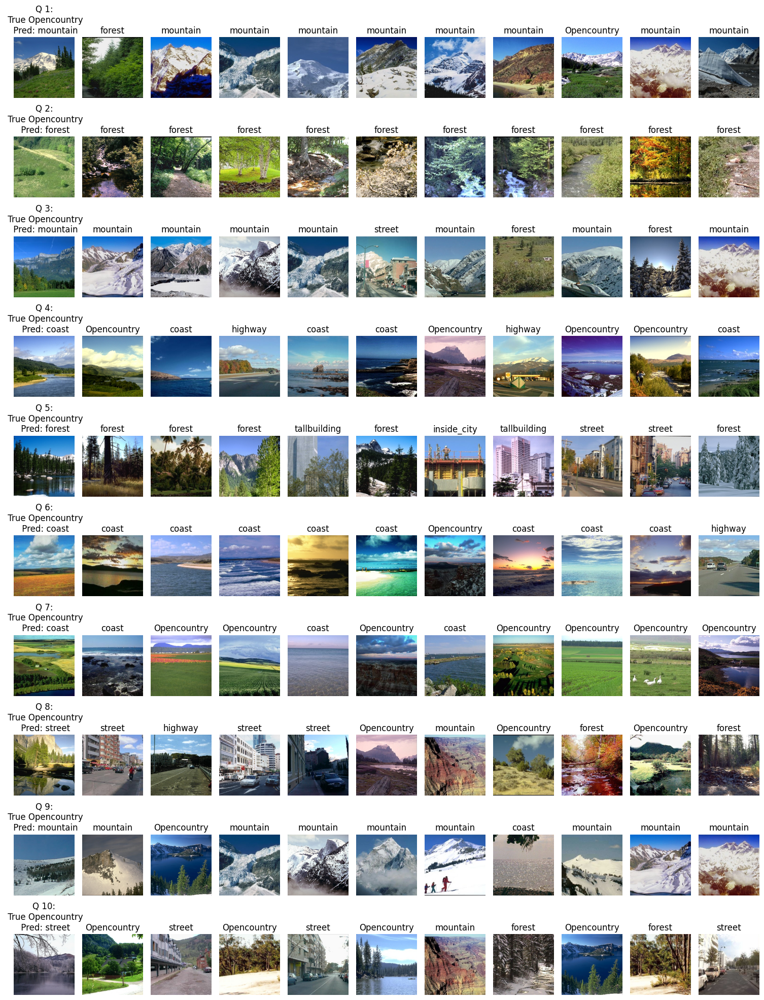

In [41]:
plot_CIR(result_dict=CIR,train_labels=labels_train,  train_image_paths=bovw.train_dataset['image_paths'], test_image_paths=bovw.test_dataset['image_paths'], clas="Opencountry", sample=10)

### 4.2 Plots of the visual words distribution based on best results of different methods
Another method to assess the effectiveness of our manually crafted features is by examining the distribution of the points. The following code creates several plots; the first one is the distribution of the training data, and the others are the distribution of the test points.
 
It is noteworthy that there is a considerable overlap among the points associated with each class. 

This observation helps elucidate some of the previously observed results and the results that can be seen in the subplots by the cross and the circles.

Of course, there are some points where, if K>1, will be correctly classified.


In [53]:
config

{'descriptor': 'dense_sift',
 'step_size': 10,
 'n_words': 223,
 'n_features': 164,
 'n_neigh': None,
 'metric': <function __main__.histogram_intersection_distance(X, Y)>,
 'n_folds': None,
 'n_components': 59,
 'level_pyramid': 2,
 'C': 0.01,
 'degree_pol': 2,
 'kernel': 'precomputed',
 'classifier': 'logistic',
 'fisher': False,
 'scaler': True}

In [54]:
print("Distribution Plots based on classifier: {}".format(config["classifier"]))

Distribution Plots based on classifier: logistic


In [55]:
labels_train = bovw.train_dataset['labels']
labels_test = bovw.test_dataset['labels']

vwords_test = bovw._extract_test_visual_words()
vwords_train = bovw._extract_train_visual_words()

whole_points = np.concatenate((vwords_train, vwords_test), axis= 0)
whole_labels = list(labels_train) + list(labels_test)

In [56]:
### Embeddings in 2 dimensions in order to plot them
tsne = TSNE(n_components=2, perplexity=30, random_state=42)
embeddings_2d = tsne.fit_transform(whole_points)

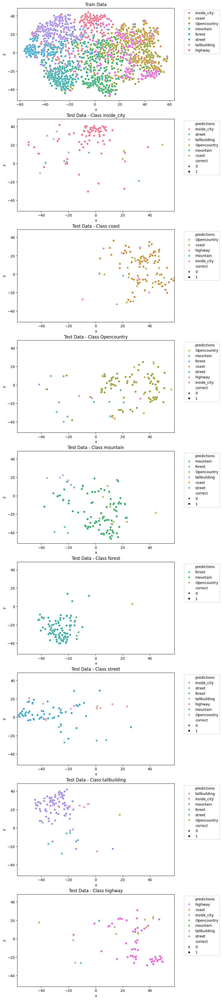

In [58]:

classes = np.unique(labels_train)
num_classes = len(classes)

df = pd.DataFrame()

df["x"] = embeddings_2d[:, 0]
df['y'] = embeddings_2d[:, 1]
df["true_labels"] = whole_labels
df['predictions'] = list(labels_train) + list(predictions)
level = ["train" if _ < 1882 else "test" for _ in range(len(whole_labels))]
df["level"] = level
df["correct"] = (df["true_labels"] == df["predictions"]).astype("int")


fig, axs = plt.subplots(nrows=num_classes + 1, figsize=(8, 50), sharex=False, sharey=True)
classes = df["predictions"].unique()
class_colors = sns.color_palette("husl", n_colors=len(classes))

# Mapear clases a colores
class_color_dict = dict(zip(classes, class_colors))


sns.scatterplot(data = df[df["level"]== "train"], x="x", y="y", hue = "predictions", ax=axs[0], palette=class_color_dict)
axs[0].set_title("Train Data")
axs[0].legend(bbox_to_anchor=(1.05, 1), loc='upper left')  # Leyenda para el primer subgráfico

for y, cls in enumerate(classes):
    sns.scatterplot(data = df[(df["level"]== "test") & (df["true_labels"] == cls) ], x="x", y="y", hue = "predictions", ax=axs[y+1], palette=class_color_dict, style="correct", markers={0: "X", 1: "o"})
    axs[y + 1].set_title(f"Test Data - Class {cls}")
    axs[y + 1].autoscale()
    axs[y + 1].set_xlim(df["x"].min(), df["x"].max())  # Ajusta los límites del eje x
    axs[y + 1].legend(bbox_to_anchor=(1.05, 1), loc='upper left')  # Leyenda para los subgráficos restantes


plt.show()

    
    
    #train_indexes_cls = np.where(np.array(labels_train == cls))
    
    


In [59]:
df["correct"] = (df["true_labels"] == df["predictions"]).astype("int")

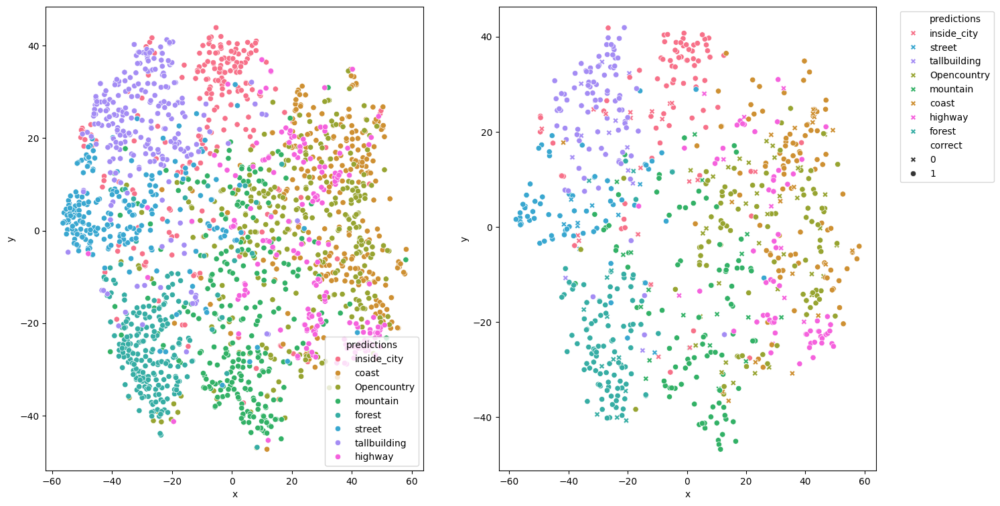

In [61]:
fig, axs = plt.subplots(ncols=2, figsize=(16,9))
classes = df["predictions"].unique()
class_colors = sns.color_palette("husl", n_colors=len(classes))

# Mapear clases a colores
class_color_dict = dict(zip(classes, class_colors))



sns.scatterplot(data = df[df["level"]== "train"], x="x", y="y", hue = "predictions", ax=axs[0], palette=class_color_dict)

sns.scatterplot(data = df[df["level"]== "test"], x="x", y="y", hue = "predictions", ax=axs[1], palette=class_color_dict, style="correct", markers={0: "X", 1: "o"})
axs[1].legend(bbox_to_anchor=(1.05, 1), loc='upper left')  # Leyenda para el primer subgráfico


## 5. Statistical comparison of models
To further analyze the results and to say if one model is significanlty better than the other we perform two statistical tests.

In [ ]:
config = {
    'descriptor': 'dense_sift',
    'step_size': 10,
    'n_words': 223,
    "n_features": 164,
    'n_neigh': None,
    'metric': histogram_intersection_distance,
    'n_folds': 5,
    'n_components': 59,
    'level_pyramid': 2,
    'C':0.01,
    'degree_pol': 2,
    'kernel': 'precomputed',
    'classifier': 'logistic',
    'fisher': False,
    'scaler': True,
}
bovw = BoVW(config, preload_features=True)
#bovw.fit()
#predictions, y_score = bovw.predict()

predictions_logistic, y_scores_Logistic, labels_logistica = cross_validation(bovw)


Cross validation:  20%|█████▍                     | 1/5 [00:10<00:41, 10.40s/it]

In [ ]:
logistic_results = {"f_score": [], "acc": []}
for ii, (p, l) in enumerate(zip(predictions_logistic, labels_logistica)):
    logistic_results["f_score"].append(average_f1(p, l))
    logistic_results["acc"].append(accuracy(p, l))
    
logistic_results

In [15]:
logistic_results = {'f_score': [0.8019994438154457,
  0.820105326656096,
  0.8135009749989667,
  0.8150650035772701,
  0.7979623549669496],
 'acc': [0.7984084880636605,
  0.8218085106382979,
  0.8085106382978723,
  0.8111702127659575,
  0.7925531914893617]}

In [10]:
config = {
    'descriptor': 'dense_sift',
    'step_size': 10,
    'n_words': 890,
    "n_features": 164,
    'n_neighbors': 9,
    'metric': "euclidean",
    'n_folds': 5,
    'n_components': 51,
    'level_pyramid': 1,
    'C':0.01,
    'degree_pol': 2,
    'kernel': 'precomputed',
    'classifier': 'knn',
    'fisher': False,
    'scaler': True,
    "algorithm":"brute"
}

bovw = BoVW(config, preload_features=True)

predictions_knn, y_scores_knn, labels_knn = cross_validation(bovw)


Cross validation: 100%|███████████████████████████| 5/5 [01:11<00:00, 14.26s/it]


In [13]:
knn_results = {"f_score": [], "acc": []}
for ii, (p, l) in enumerate(zip(predictions_knn, labels_knn)):
    knn_results["f_score"].append(average_f1(p, l))
    knn_results["acc"].append(accuracy(p, l))
    

In [14]:
knn_results = {'f_score': [0.8231441883510563,
  0.8200976146598179,
  0.8247132967291801,
  0.792206175973242,
  0.7985462428492117],
 'acc': [0.8116710875331565,
  0.8138297872340425,
  0.8164893617021277,
  0.7845744680851063,
  0.7845744680851063]}

In [11]:

config = {
    'descriptor': 'dense_sift',
    'step_size': 12,
    'n_words': 501,
    "n_features": 164,
    'n_neigh': None,
    'metric': histogram_intersection_distance,
    'n_folds': 5,
    'n_components': 150,
    'level_pyramid': 2,
    'C':0.01,
    'degree_pol': 2,
    'kernel': 'precomputed',
    'classifier': 'svm',
    'fisher': False,
    'scaler': False,
}
bovw = BoVW(config, preload_features=False)

predictions_svm, y_scores_svm, labels_svm = cross_validation(bovw)

Cross validation: 100%|███████████████████████████| 5/5 [01:18<00:00, 15.74s/it]


In [12]:
svm_results = {"f_score": [], "acc": []}
for ii, (p, l) in enumerate(zip(predictions_svm, labels_svm)):
    svm_results["f_score"].append(average_f1(p, l))
    svm_results["acc"].append(accuracy(p, l))

In [13]:
svm_results

{'f_score': [0.8285541525465532,
  0.8516451345383534,
  0.8416992538340935,
  0.8048315565334039,
  0.8115529529924878],
 'acc': [0.8275862068965517,
  0.8563829787234043,
  0.8324468085106383,
  0.800531914893617,
  0.8058510638297872]}

In [19]:
from scipy.stats import ttest_rel

def compare_models(model1_results, model2_results, metric='f_score'):
    """
    Realiza una prueba t de Student emparejada para comparar dos modelos en función de una métrica dada.

    Parameters:
    - model1_results: Resultados del primer modelo (diccionario).
    - model2_results: Resultados del segundo modelo (diccionario).
    - metric: Métrica a utilizar para la comparación (por defecto 'f_score').

    Returns:
    - p_value: Valor p de la prueba t de Student.
    - result: True si el modelo 1 es significativamente mejor, False en caso contrario.
    """

    if metric not in model1_results or metric not in model2_results:
        raise ValueError(f'Métrica "{metric}" no encontrada en los resultados proporcionados.')

    # Realiza la prueba t de Student emparejada
    _, p_value = ttest_rel(model1_results[metric], model2_results[metric])

    # Si el valor p es menor que 0.05, se rechaza la hipótesis nula y se considera que hay una diferencia significativa
    result = p_value < 0.05

    return p_value, result



### 5.1 Fscore T-student
This tests allows us to compare two models and say if one is better than the other.

In [20]:
# Ejemplo de uso:
p_value, better_model = compare_models(svm_results, knn_results)
print(f'Valor p: {p_value}, Are there evidences to say that the model 1 is better than model 2?: {better_model}')

Valor p: 0.021303644067699887, Are there evidences to say that the model 1 is better than model 2?: True


In [17]:
# Ejemplo de uso:
p_value, better_model = compare_models(svm_results, logistic_results)
print(f'Valor p: {p_value}, Are there evidences to say that the model 1 is better than model 2?: {better_model}')

Valor p: 0.07962200222468964, Are there evidences to say that the model 1 is better than model 2?: False


In [18]:
# Ejemplo de uso:
p_value, better_model = compare_models(logistic_results, knn_results)
print(f'Valor p: {p_value}, Are there evidences to say that the model 1 is better than model 2?: {better_model}')

Valor p: 0.797094745326337, Are there evidences to say that the model 1 is better than model 2?: False


### 5.2 Accuracy T-student
This tests also allows us to compare two models and say if one is better than the other.

In [21]:
# Ejemplo de uso:
p_value, better_model = compare_models(svm_results, knn_results, metric="acc")
print(f'Valor p: {p_value}, Are there evidences to say that the model 1 is better than model 2?: {better_model}')

# Ejemplo de uso:
p_value, better_model = compare_models(svm_results, logistic_results, metric="acc")
print(f'Valor p: {p_value}, Are there evidences to say that the model 1 is better than model 2?: {better_model}')

# Ejemplo de uso:
p_value, better_model = compare_models(logistic_results, knn_results, metric="acc")
print(f'Valor p: {p_value}, Are there evidences to say that the model 1 is better than model 2?: {better_model}')

Valor p: 0.012367968308294662, Are there evidences to say that the model 1 is better than model 2?: True
Valor p: 0.08656220459878128, Are there evidences to say that the model 1 is better than model 2?: False
Valor p: 0.5760980179913617, Are there evidences to say that the model 1 is better than model 2?: False


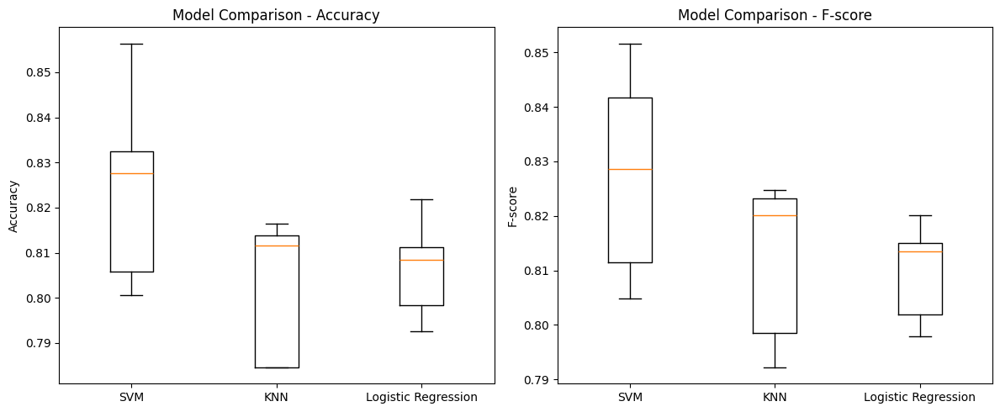

In [22]:
# Data
acc_data = [svm_results['acc'], knn_results['acc'], logistic_results['acc']]
f_score_data = [svm_results['f_score'], knn_results['f_score'], logistic_results['f_score']]
labels = ['SVM', 'KNN', 'Logistic Regression']

# Plotting
fig, axes = plt.subplots(1, 2, figsize=(12, 5))

# Boxplot for Accuracy
axes[0].boxplot(acc_data, labels=labels)
axes[0].set_title('Model Comparison - Accuracy')
axes[0].set_ylabel('Accuracy')

# Boxplot for F-score
axes[1].boxplot(f_score_data, labels=labels)
axes[1].set_title('Model Comparison - F-score')
axes[1].set_ylabel('F-score')

plt.tight_layout()
plt.show()